<a href="https://colab.research.google.com/github/Createdd/computervision_ue/blob/main/anomaly_detection_grayscale_working.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

available on 

## https://colab.research.google.com/drive/1UXrw17Lsbt-hsOIerbMG4JuFzpn73DWK

In [1]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

Sun Jan  9 15:11:48 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 495.44       Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   40C    P0    28W / 250W |      0MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
%cd /content/drive/MyDrive/cv_data

/content/drive/MyDrive/cv_data


In [4]:
# !apt install unzip
# !unzip ./data_WiSAR.zip -d .

In [5]:
%ls

data/  data_WiSAR.zip  integrated/  logs/  model/  model_plot.png


In [6]:
import torchvision
import torch
import torch.nn as nn

import torch
import time
import random
import matplotlib.pyplot as plt
import torch.nn as nn
import numpy as np
import pandas as pd
import seaborn as sns
from collections import defaultdict
from datetime import timedelta

!pip install ipython-autotime


# https://afagarap.github.io/2020/01/26/implementing-autoencoder-in-pytorch.html
# https://benjoe.medium.com/anomaly-detection-using-pytorch-autoencoder-and-mnist-31c5c2186329
# https://medium.com/analytics-vidhya/anomaly-detection-in-images-autoencoders-b780abf88f51

## Load data


In [7]:
from torchvision import datasets, transforms

# data_dir = './data'
data_dir = './integrated'

train_dir = data_dir + '/train'
validation_dir = data_dir + '/validation'
test_dir = data_dir + '/test'


# DATA_DIR = 'data/train/train-1-0/0-B01.png'

# transform = transforms.Compose([transforms.Resize(255),
#                                 transforms.CenterCrop(224),
#                                 transforms.ToTensor()])
# dataset = datasets.ImageFolder(data_dir, transform=transform)

# train_transforms = transforms.Compose([
#                                         transforms.RandomRotation(30),
#                                        transforms.RandomResizedCrop(224),
#                                        transforms.RandomHorizontalFlip(),
#                                       transforms.ToTensor(),
#                                       transforms.Normalize([0.5, 0.5, 0.5], 
#                                                            [0.5, 0.5, 0.5])])
train_transforms = transforms.Compose([
                                      #  transforms.Resize(1024), #225
                                      #transforms.CenterCrop(224),
                                      transforms.ToTensor(),
                                      #  transforms.Normalize([0.5, 0.5, 0.5], 
                                      #                     [0.5, 0.5, 0.5])])
                                       transforms.Grayscale(num_output_channels=1),
                                      transforms.Normalize([0.5],  # if grayscale
                                                           [0.5])])

train_data = datasets.ImageFolder(train_dir, 
                                  transform=train_transforms)
test_data = datasets.ImageFolder(test_dir, 
                                 transform=train_transforms)
validation_data = datasets.ImageFolder(validation_dir, 
                                  transform=train_transforms)

train_loader = torch.utils.data.DataLoader(train_data, 
                                           shuffle=True,
                                          batch_size=32)
test_loader = torch.utils.data.DataLoader(test_data, 
                                         batch_size=32)
validation_loader = torch.utils.data.DataLoader(validation_data, 
                                         batch_size=32)

In [8]:
train_data

Dataset ImageFolder
    Number of datapoints: 26
    Root location: ./integrated/train
    StandardTransform
Transform: Compose(
               ToTensor()
               Grayscale(num_output_channels=1)
               Normalize(mean=[0.5], std=[0.5])
           )

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


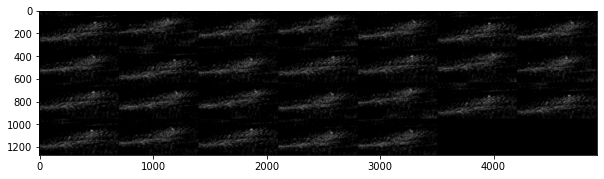

In [9]:
def imshow(img):
    plt.figure(figsize=(10,8))
    plt.imshow(img.permute(1,2,0))


image, labels = next(iter(train_loader))
imshow(torchvision.utils.make_grid(image,nrow=7))

In [10]:
# import cv2

# def load_images_from_folder(folder):
    
#     images = []
#     for filename in os.listdir(folder):
#         img = cv2.imread(os.path.join(folder,filename))
#         if img is not None:
#             images.append(img)
#         if len(images)>5:
#             break
    
#     plt.figure(figsize=(16,8))    
#     for img,x in zip(images,range(1,7)):
#         plt.subplot(2,3,x)
#         plt.imshow(img)


# for fold in os.walk(train_dir):
#   for im in fold[1]:
#     load_images_from_folder(train_dir+'/'+im)

## Build architecture

In [11]:
# import tensorflow as tf

# # Create the Encoder and Decoder
# #pass the gray scale input image of size(28,28,1)
# inputs = tf.keras.Input(shape=(28, 28, 1), name='input_layer')
# # Conv Block 1 -> BatchNorm->leaky Relu
# encoded = tf.keras.layers.Conv2D(32, kernel_size=3, strides= 1, padding='same', name='conv_1')(inputs)
# encoded = tf.keras.layers.BatchNormalization(name='batchnorm_1')(encoded)
# encoded = tf.keras.layers.LeakyReLU(name='leaky_relu_1')(encoded)
# # Conv Block 2 -> BatchNorm->leaky Relu
# encoded = tf.keras.layers.Conv2D(64, kernel_size=3, strides= 2, padding='same', name='conv_2')(encoded)
# encoded = tf.keras.layers.BatchNormalization(name='batchnorm_2')(encoded)
# encoded = tf.keras.layers.LeakyReLU(name='leaky_relu_2')(encoded)
# # Conv Block 3 -> BatchNorm->leaky Relu
# encoded = tf.keras.layers.Conv2D(64, kernel_size=3, strides=2, padding='same', name='conv_3')(encoded)
# encoded = tf.keras.layers.BatchNormalization(name='batchnorm_3')(encoded)
# encoded = tf.keras.layers.LeakyReLU(name='leaky_relu_3')(encoded)
# #Decoder
# # DeConv Block 1-> BatchNorm->leaky Relu
# decoded = tf.keras.layers.Conv2DTranspose(64, 3, strides= 1, padding='same',name='conv_transpose_1')(encoded)
# decoded = tf.keras.layers.BatchNormalization(name='batchnorm_4')(decoded)
# decoded = tf.keras.layers.LeakyReLU(name='leaky_relu_4')(decoded)
# # DeConv Block 2-> BatchNorm->leaky Relu
# decoded = tf.keras.layers.Conv2DTranspose(64, 3, strides= 2, padding='same', name='conv_transpose_2')(decoded)
# decoded = tf.keras.layers.BatchNormalization(name='batchnorm_5')(decoded)
# decoded = tf.keras.layers.LeakyReLU(name='leaky_relu_5')(decoded)
# # DeConv Block 3-> BatchNorm->leaky Relu
# decoded = tf.keras.layers.Conv2DTranspose(32, 3, 2, padding='same', name='conv_transpose_3')(decoded)
# decoded = tf.keras.layers.BatchNormalization(name='batchnorm_6')(decoded)
# decoded = tf.keras.layers.LeakyReLU(name='leaky_relu_6')(decoded)
# # output
# outputs = tf.keras.layers.Conv2DTranspose(1, 3, 1,padding='same', activation='sigmoid', name='conv_transpose_4')(decoded)

# import tensorflow as tf
# from tensorflow.keras import Model, Input, regularizers
# from tensorflow.keras.layers import Dense, Conv2D, MaxPool2D, UpSampling2D, Add, Dropout
# from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
# from keras.preprocessing import image

# ------------------------------------------------------------------------------------------------------------------------------------------------------------------

# Input_img = Input(shape=(80, 80, 3))  
    
# #encoding architecture
# x1 = Conv2D(64, (3, 3), activation='relu', padding='same', kernel_regularizer=regularizers.l1(10e-10))(Input_img)
# x2 = Conv2D(64, (3, 3), activation='relu', padding='same', kernel_regularizer=regularizers.l1(10e-10))(x1)
# x3 = MaxPool2D(padding='same')(x2)
# x4 = Conv2D(128, (3, 3), activation='relu', padding='same', kernel_regularizer=regularizers.l1(10e-10))(x3)
# x5 = Conv2D(128, (3, 3), activation='relu', padding='same', kernel_regularizer=regularizers.l1(10e-10))(x4)
# x6 = MaxPool2D(padding='same')(x5)
# encoded = Conv2D(256, (3, 3), activation='relu', padding='same', kernel_regularizer=regularizers.l1(10e-10))(x6)
# #encoded = Conv2D(64, (3, 3), activation='relu', padding='same')(x2)
# # decoding architecture
# x7 = UpSampling2D()(encoded)
# x8 = Conv2D(128, (3, 3), activation='relu', padding='same', kernel_regularizer=regularizers.l1(10e-10))(x7)
# x9 = Conv2D(128, (3, 3), activation='relu', padding='same', kernel_regularizer=regularizers.l1(10e-10))(x8)
# x10 = Add()([x5, x9])
# x11 = UpSampling2D()(x10)
# x12 = Conv2D(64, (3, 3), activation='relu', padding='same', kernel_regularizer=regularizers.l1(10e-10))(x11)
# x13 = Conv2D(64, (3, 3), activation='relu', padding='same', kernel_regularizer=regularizers.l1(10e-10))(x12)
# x14 = Add()([x2, x13])
# # x3 = UpSampling2D((2, 2))(x3)
# # x2 = Conv2D(128, (3, 3), activation='relu', padding='same')(x3)
# # x1 = Conv2D(256, (3, 3), activation='relu', padding='same')(x2)
# decoded = Conv2D(3, (3, 3), padding='same',activation='relu', kernel_regularizer=regularizers.l1(10e-10))(x14)

# autoencoder = Model(Input_img, decoded)
# autoencoder.compile(optimizer='adam', loss='mse', metrics=['accuracy'])

In [13]:
import tensorflow as tf
from tensorflow.keras import layers

from tensorflow.keras.models import Model

target_size = (1024, 1024)
channel = (1,)
input_size = target_size + channel
batch_size=16


# input = layers.Input(shape=(28, 28, 1))
input = layers.Input(shape=input_size)


# Encoder
x = layers.Conv2D(32, (3, 3), activation="relu", padding="same")(input)
x = layers.MaxPooling2D((2, 2), padding="same")(x)
x = layers.Conv2D(32, (3, 3), activation="relu", padding="same")(x)
x = layers.MaxPooling2D((2, 2), padding="same")(x)

# Decoder
x = layers.Conv2DTranspose(32, (3, 3), strides=2, activation="relu", padding="same")(x)
x = layers.Conv2DTranspose(32, (3, 3), strides=2, activation="relu", padding="same")(x)
x = layers.Conv2D(1, (3, 3), activation="sigmoid", padding="same")(x)

# Autoencoder

# autoencoder.compile(optimizer="adam", loss="binary_crossentropy")


def SSIMLoss(y_true, y_pred):
  return 1 - tf.reduce_mean(tf.image.ssim(y_true, y_pred,1.0))

# autoencoder = tf.keras.Model(inputs, outputs)
autoencoder = Model(input, x)
optimizer = tf.keras.optimizers.Adam(lr = 0.0005)
autoencoder.compile(optimizer=optimizer, loss=SSIMLoss)
# autoencoder = load_model('./model/autoencoder.h5')

autoencoder.summary()


Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 1024, 1024, 1)]   0         
                                                                 
 conv2d (Conv2D)             (None, 1024, 1024, 32)    320       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 512, 512, 32)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 512, 512, 32)      9248      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 256, 256, 32)     0         
 2D)                                                             
                                                                 
 conv2d_transpose (Conv2DTra  (None, 512, 512, 32)     9248  

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


In [14]:
# from keras.utils.vis_utils import plot_model
# plot_model(autoencoder, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

In [16]:
# todo create params and pass over variables
from keras.preprocessing.image import ImageDataGenerator

# https://www.tensorflow.org/api_docs/python/tf/keras/preprocessing/image/ImageDataGenerator#flow_from_directory

data_gen = ImageDataGenerator(rescale=1 / 255)

train_generator = data_gen.flow_from_directory(
    train_dir, 
    target_size = target_size,
    # classes=['1','2'],
    color_mode='grayscale', 
    class_mode='input', 
    batch_size=batch_size)#256)

test_generator = data_gen.flow_from_directory(
    test_dir, 
    target_size = target_size, 
    color_mode='grayscale', 
    class_mode='input', 
    batch_size=batch_size)

validation_generator = data_gen.flow_from_directory(
    validation_dir, 
    target_size = target_size, 
    color_mode='grayscale', 
    class_mode='input', 
    batch_size=batch_size)



Found 26 images belonging to 26 classes.
Found 13 images belonging to 13 classes.
Found 11 images belonging to 11 classes.


In [17]:
test_generator.samples

13

In [18]:
%load_ext tensorboard
%reload_ext tensorboard

from keras.callbacks import TensorBoard
import tensorflow as tf
import datetime, os

## remove old logs
import shutil
shutil.rmtree("logs", ignore_errors=False)
###

logdir = os.path.join("logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
tensorboard_callback = tf.keras.callbacks.TensorBoard(logdir, histogram_freq=1)

In [41]:
# https://keras.io/api/models/model_training_apis/
%load_ext autotime

hist=autoencoder.fit(
                x = train_generator,
                epochs=10,
                #batch_size=128, # doesnt need to be specified when generator is used
                #shuffle=True,
                validation_data=(validation_generator),
                callbacks=[tensorboard_callback]
                )


The autotime extension is already loaded. To reload it, use:
  %reload_ext autotime
Epoch 1/10
2/2 [==============================] - 2s 2s/step - loss: 0.0602 - val_loss: 0.0531
Epoch 2/10
2/2 [==============================] - 2s 2s/step - loss: 0.0588 - val_loss: 0.0518
Epoch 3/10
2/2 [==============================] - 2s 1s/step - loss: 0.0574 - val_loss: 0.0506
Epoch 4/10
2/2 [==============================] - 2s 1s/step - loss: 0.0562 - val_loss: 0.0495
Epoch 5/10
2/2 [==============================] - 2s 1s/step - loss: 0.0549 - val_loss: 0.0483
Epoch 6/10
2/2 [==============================] - 2s 1s/step - loss: 0.0537 - val_loss: 0.0473
Epoch 7/10
2/2 [==============================] - 2s 1s/step - loss: 0.0526 - val_loss: 0.0465
Epoch 8/10
2/2 [==============================] - 2s 1s/step - loss: 0.0518 - val_loss: 0.0461
Epoch 9/10
2/2 [==============================] - 2s 1s/step - loss: 0.0514 - val_loss: 0.0447
Epoch 10/10
2/2 [==============================] - 2s 1s/step

In [42]:
# autoencoder.save('./model/autoencoder.h5')

time: 614 µs (started: 2022-01-09 15:35:12 +00:00)


In [ ]:
# %tensorboard --logdir logs
# ## notebook.display(port=6006, height=1000) 

# from tensorboard import notebook
# notebook.list()

In [44]:
predictions = autoencoder.predict(test_generator)
decoded_imgs = predictions

# decoded_mnistimgs= autoencoder.predict(x_mnisttest)

time: 751 ms (started: 2022-01-09 15:35:12 +00:00)


In [45]:
def display(array1, array2, target_size=(28,28)):
    """
    Displays ten random images from each one of the supplied arrays.
    """

    n = 10

    indices = np.random.randint(len(array1), size=n)
    images1 = array1[indices, :]
    images2 = array2[indices, :]

    plt.figure(figsize=(20, 4))
    for i, (image1, image2) in enumerate(zip(images1, images2)):
        ax = plt.subplot(2, n, i + 1)
        plt.imshow(image1.reshape(target_size))
        plt.gray()
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)

        ax = plt.subplot(2, n, i + 1 + n)
        plt.imshow(image2.reshape(target_size))
        plt.gray()
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)

    plt.show()


time: 9.99 ms (started: 2022-01-09 15:35:12 +00:00)


In [46]:
# all_images = [next(test_generator) for _ in range(4)]
# all_images

time: 718 µs (started: 2022-01-09 15:35:12 +00:00)


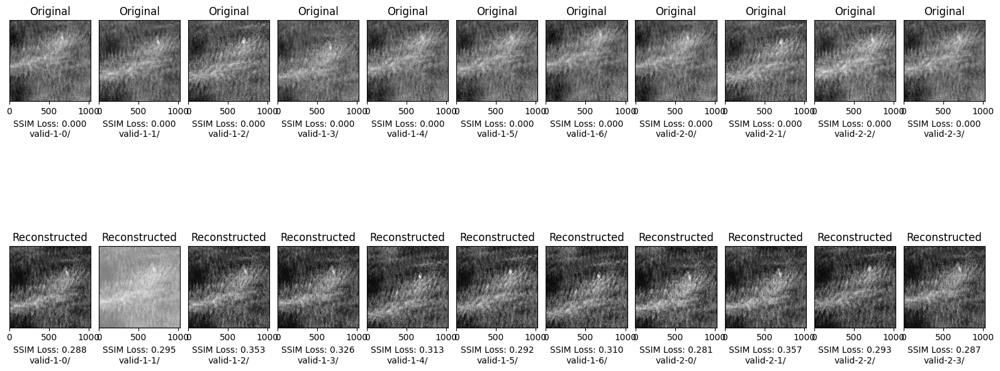

time: 5.76 s (started: 2022-01-09 15:40:58 +00:00)


In [69]:
plt.figure(figsize=(20, 14), dpi=100)
plt.subplots_adjust( wspace=0.1, hspace=0.07)
plt_a=1

n=11
for i in range(n):

    gen_file_name = validation_generator.filenames[i]
    # a, b = iter_nth(test_generator, i)
    img = next(validation_generator)[0][i]
    loss_orig = SSIMLoss(img,img) 
    # print(a.mean(), i)
    loss_reconstructed = SSIMLoss(img,predictions[i]) 

    # Original training dataset vs Original training
    ax = plt.subplot(3, n, plt_a)
    plt.imshow(img.reshape(target_size))
    ax.get_xaxis().set_visible(True)
    ax.get_yaxis().set_visible(False)
    # value_a = SSIMLoss(next(test_generator)[0][i], next(test_generator)[0][i]) # loss should be zero
    ax.set_title(f"Original")
    label = f'SSIM Loss: {loss_orig:.3f}\n{gen_file_name[:10]}'
    ax.set_xlabel(label)
    
    # Reconstructed good data  vs Original training data
    ax = plt.subplot(3, n, plt_a + n )
    plt.imshow(predictions[i].reshape(target_size))
    ax.get_xaxis().set_visible(True)
    ax.get_yaxis().set_visible(False) 

    # value_a = SSIMLoss(predictions[i], next(test_generator)[0][i])
    ax.set_title(f"Reconstructed")
    label = f'SSIM Loss: {loss_reconstructed:.3f}\n{gen_file_name[:10]}'
    ax.set_xlabel(label)
    
    # Reconstructed anomalous data  vs Original training data
    # ax = plt.subplot(3, n, plt_a + 2*n)
    # plt.imshow(decoded_mnistimgs[i].reshape(28,28))
    # ax.get_xaxis().set_visible(True)
    # ax.get_yaxis().set_visible(False)
    # value = SSIMLoss(decoded_mnistimgs[i], decoded_imgs[i])
    # label = 'SSIM Loss value: {:.3f}'
    # ax.set_title("Anomal Image " )
    # ax.set_xlabel(label.format(value) )
    plt_a+=1
plt.show()

11
SSIM: 0.8384297845242956 
 Diff: [[ 9 10 11 ... 12 11 10]
 [ 7  8  7 ... 11 11 10]
 [ 8  9  8 ... 13 12 11]
 ...
 [ 5  8  9 ... 22 21 19]
 [ 5  8  8 ... 22 21 18]
 [ 6  8  8 ... 22 20 17]]


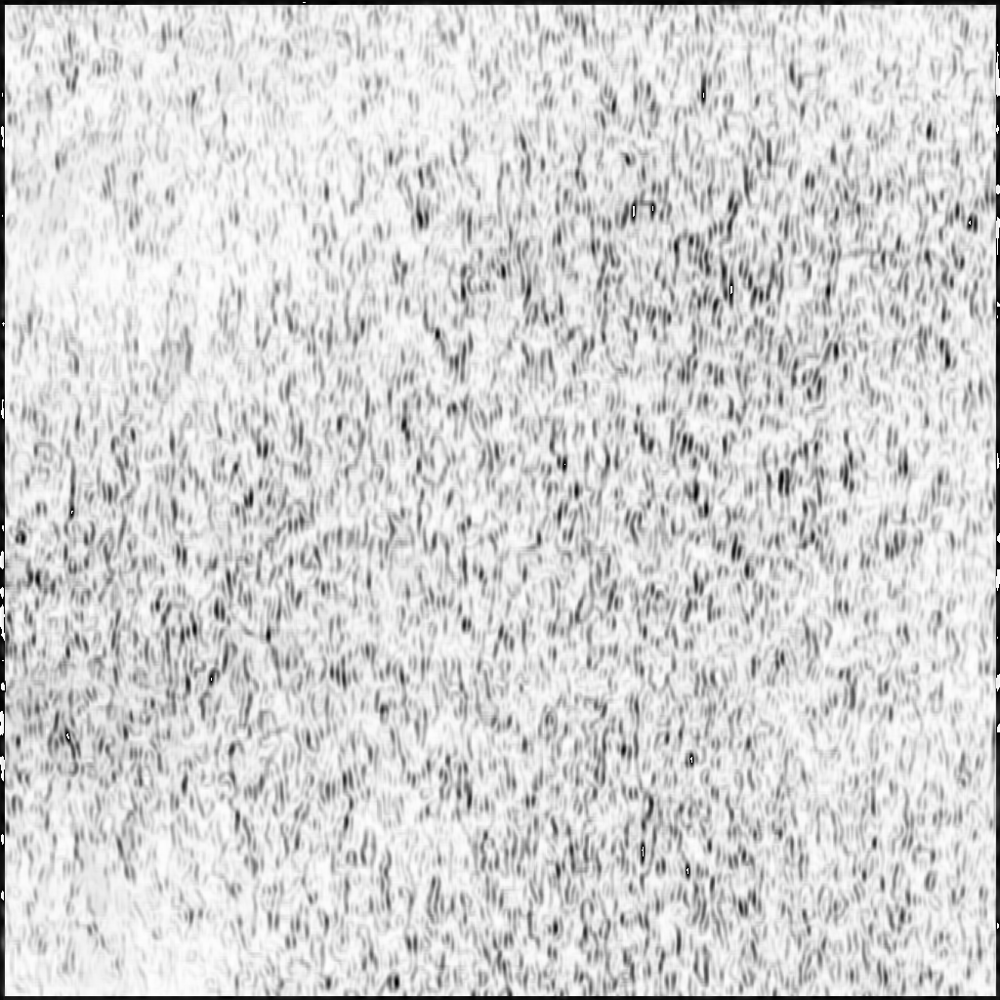

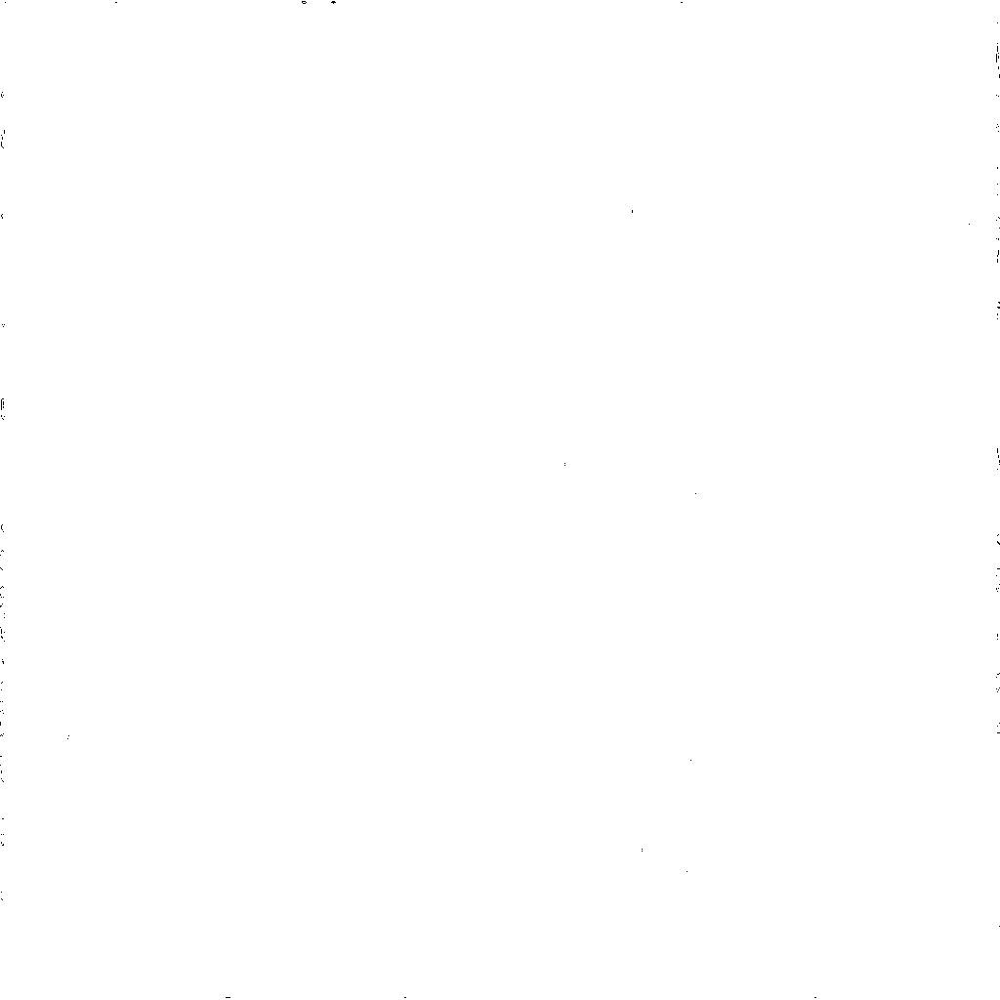

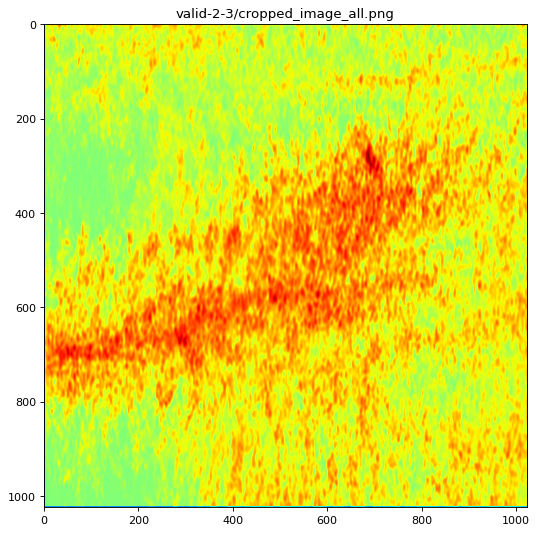

time: 1.03 s (started: 2022-01-09 15:39:51 +00:00)


In [67]:
# show similarity differences


from skimage.metrics import structural_similarity as compare_ssim
# import argparse
import imutils
import cv2
from google.colab.patches import cv2_imshow

print(len(validation_generator.filenames))
nr_img = 10

gen_file_name = validation_generator.filenames[nr_img]
img = next(validation_generator)[0][nr_img]

a_img = img
b_img =predictions[1]

a = np.squeeze(a_img)
b = np.squeeze(b_img)

loss_orig = SSIMLoss(img,img) 
loss_reconstructed = SSIMLoss(img,predictions[nr_img])


(score, diff) = compare_ssim(a, b, full=True)
diff = (diff * 255).astype("uint8")


thresh = cv2.threshold(diff, 0, 255,
	#  cv2.THRESH_BINARY_INV |
  #  cv2.THRESH_OTSU)[1]
  cv2.THRESH_BINARY)[1]
  # cv2.THRESH_TRUNC)[1]
cnts = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL,
	cv2.CHAIN_APPROX_SIMPLE)
cnts = imutils.grab_contours(cnts)

print(f'SSIM: {score} \n Diff: {diff}')#' \n {thresh} \n {cnts}')

# loop over the contours
for c in cnts:
	# compute the bounding box of the contour and then draw the
	# bounding box on both input images to represent where the two
	# images differ
	(x, y, w, h) = cv2.boundingRect(c)
	cv2.rectangle(a_img, (x, y), (x + w, y + h), (0, 0, 255), 2)
	cv2.rectangle(b_img, (x, y), (x + w, y + h), (0, 0, 255), 2)
# show the output images
plt.figure(figsize=(12, 8), dpi=80)
plt.title(gen_file_name)
plt.imshow(np.expand_dims(b_img, axis=0).reshape(target_size), cmap='jet')

# cv2_imshow(a_img)
# cv2_imshow(b_img)
cv2_imshow(diff)
cv2_imshow(thresh)




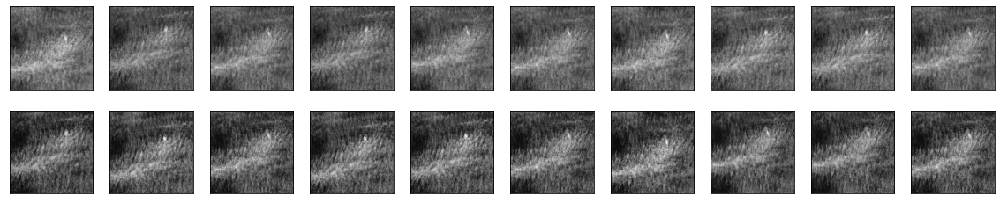

time: 2.77 s (started: 2022-01-09 15:35:19 +00:00)


In [49]:
display(next(test_generator)[0], predictions, target_size)

# new, label = next(test_generator)
# display(new, predictions)

In [50]:
predictions.shape

(13, 1024, 1024, 1)

time: 2.09 ms (started: 2022-01-09 15:35:22 +00:00)


In [51]:
test_generator.samples

13

time: 3.86 ms (started: 2022-01-09 15:35:22 +00:00)


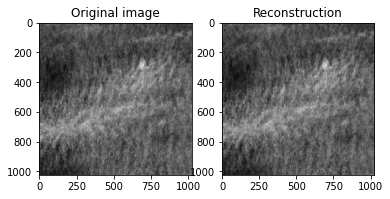

time: 3.56 s (started: 2022-01-09 15:35:22 +00:00)


In [52]:
!pip install keract
from keract import get_activations, display_activations, display_heatmaps

input_sample = next(test_generator)[0][0]
# input_sample = X[0]
reconstruction = autoencoder.predict(input_sample)

img_width, img_height = 1024, 1024

fig, axes = plt.subplots(1, 2)
fig.set_size_inches(6, 3.5)
# input_sample_reshaped = input_sample.reshape((img_width, img_height))
# reconsstruction_reshaped = reconstruction.reshape((img_width, img_height))
# axes[0].imshow(input_sample_reshaped) 
axes[0].imshow(input_sample.reshape(target_size))
axes[0].set_title('Original image')
# axes[1].imshow(reconsstruction_reshaped)
plt.imshow(np.expand_dims(input_sample, axis=0).reshape(target_size))
axes[1].set_title('Reconstruction')
plt.show()

In [70]:
activations = get_activations(autoencoder, input_sample, nested=True)
# display_activations(activations, cmap="gray", save=False) # not working in autoencoder
for layer_name, acts in activations.items():
        print(layer_name, acts.shape,'\n', end=' ')

input_1 (1024, 1024, 1) 
 conv2d (1024, 1024, 1, 32) 
 max_pooling2d (1024, 512, 1, 32) 
 conv2d_1 (1024, 512, 1, 32) 
 max_pooling2d_1 (1024, 256, 1, 32) 
 conv2d_transpose (1024, 512, 2, 32) 
 conv2d_transpose_1 (1024, 1024, 4, 32) 
 conv2d_2 (1024, 1024, 4, 1) 
 time: 650 ms (started: 2022-01-09 15:43:26 +00:00)


conv2d_2


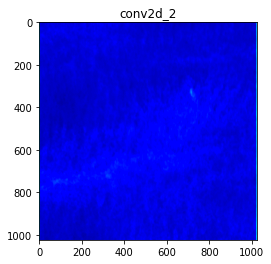

time: 1.13 s (started: 2022-01-09 15:49:51 +00:00)


In [76]:
n=1
for i in range(n):
  img = next(validation_generator)[0][i]
  activations = get_activations(autoencoder, img, nested=True)

  all_acts = [(layer_name, acts) for a,b in activations.items()]
  last_act_tuple = all_acts[-1]
  last_layer, last_act = last_act_tuple
  print(last_layer)
  

  plt.imshow(np.expand_dims(last_act[:,:,0,0], axis=0).reshape(target_size), cmap='jet')
  plt.title(layer_name)
  plt.show()


1


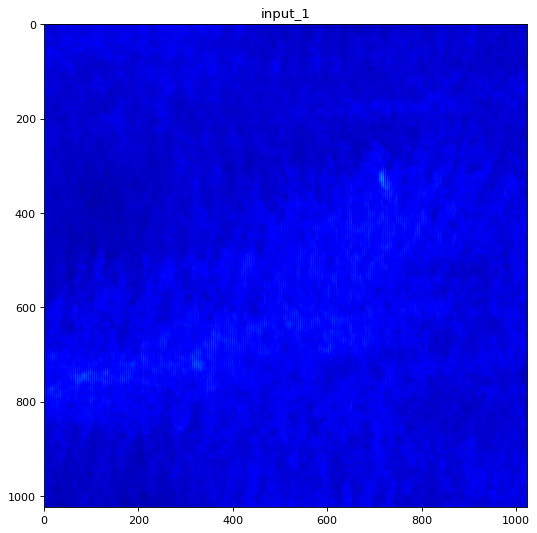

32


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide


<Figure size 960x640 with 0 Axes>

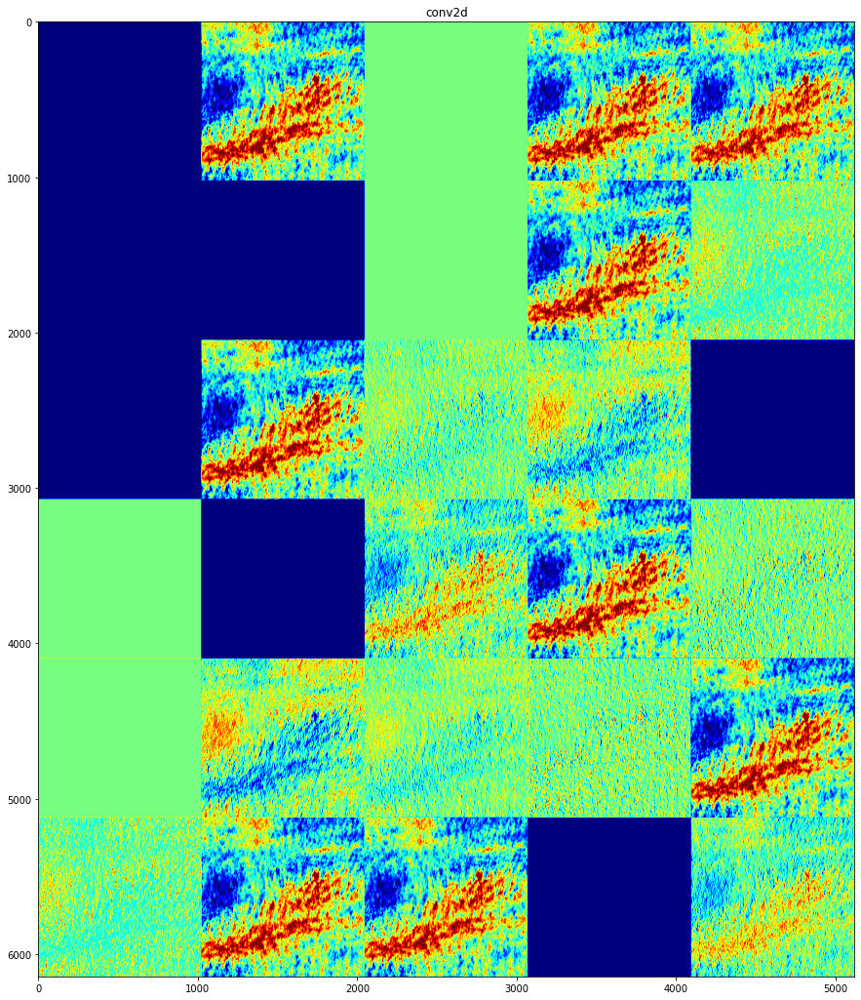

32


<Figure size 960x640 with 0 Axes>

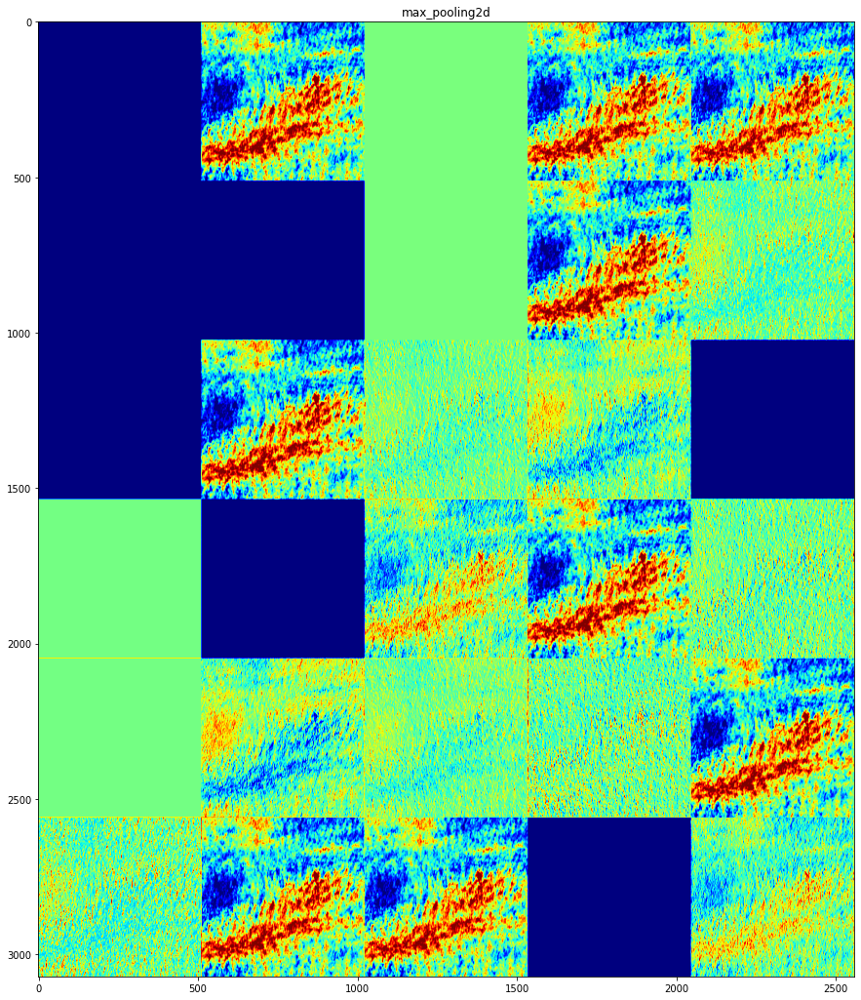

32


<Figure size 960x640 with 0 Axes>

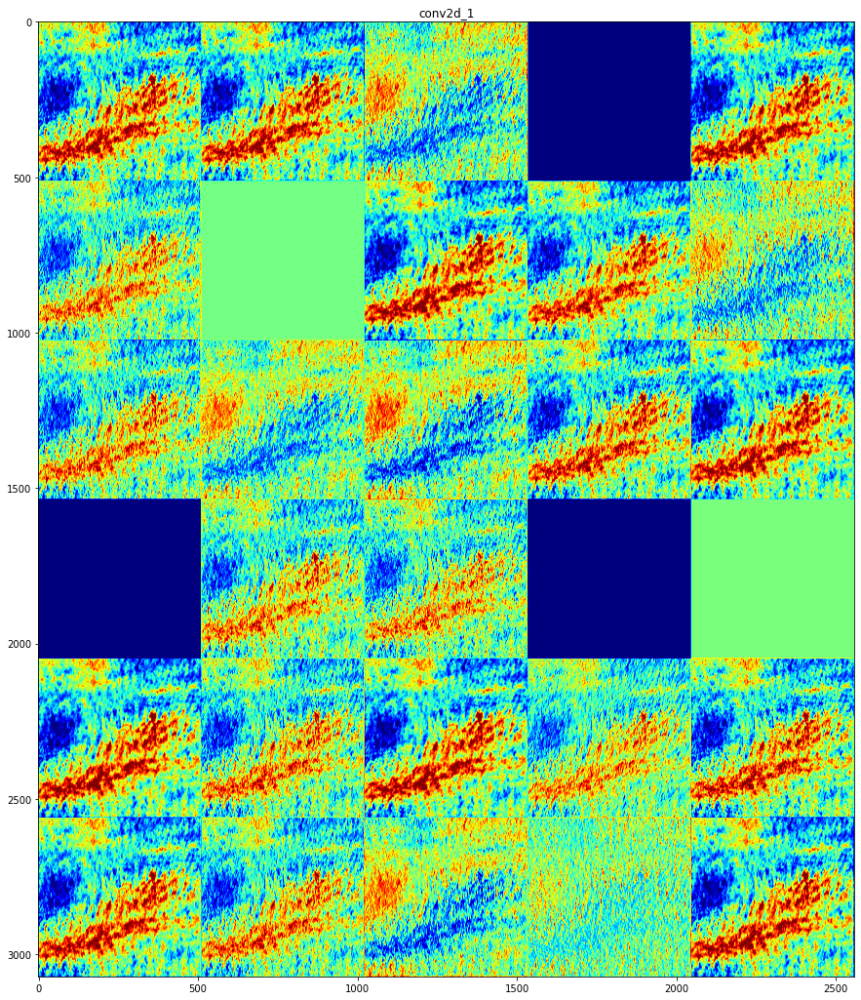

32


<Figure size 960x640 with 0 Axes>

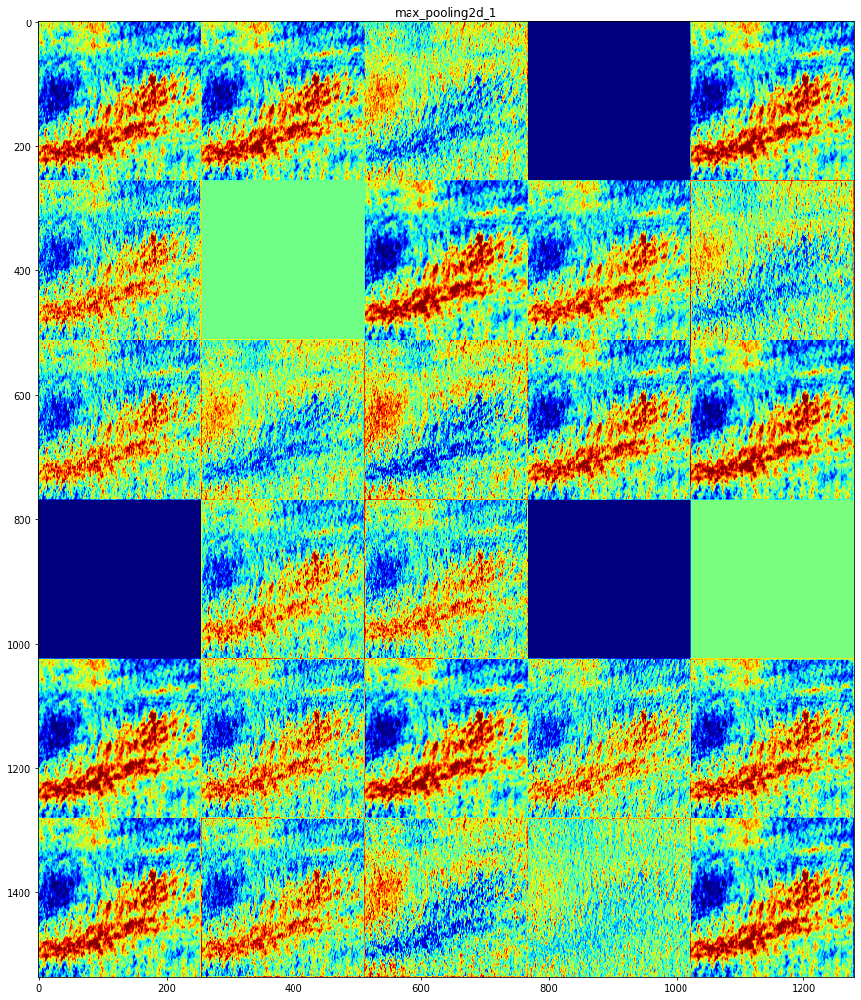

32


<Figure size 960x640 with 0 Axes>

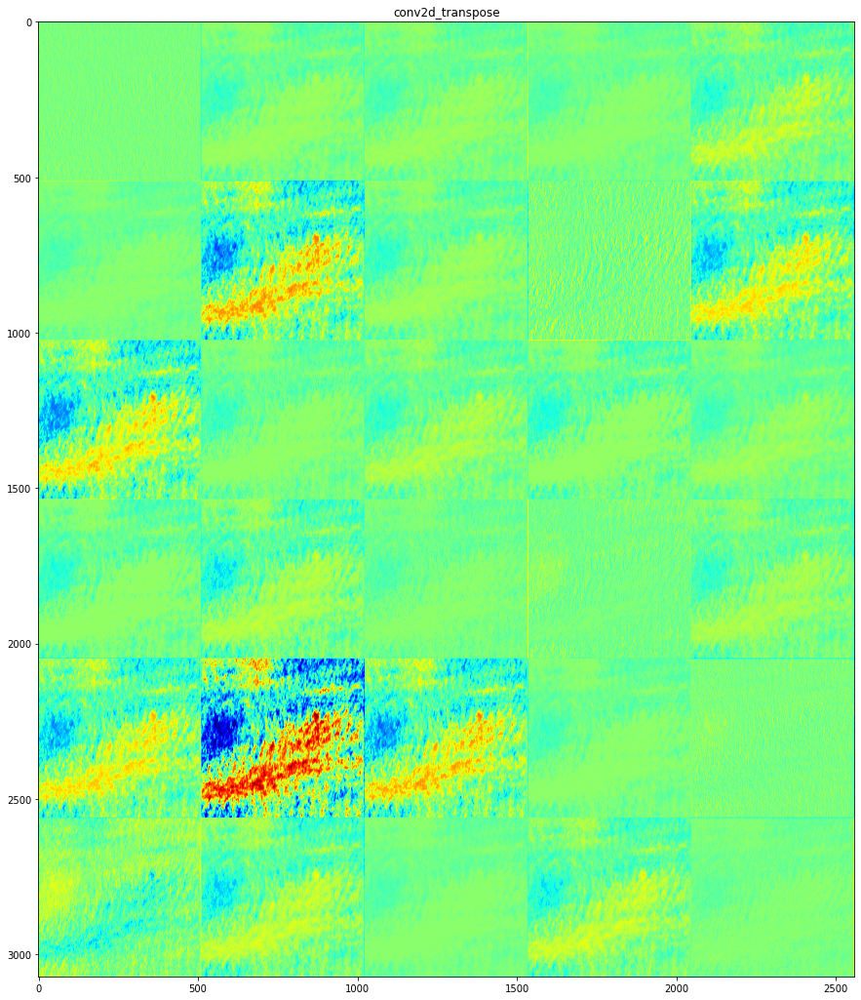

32


<Figure size 960x640 with 0 Axes>

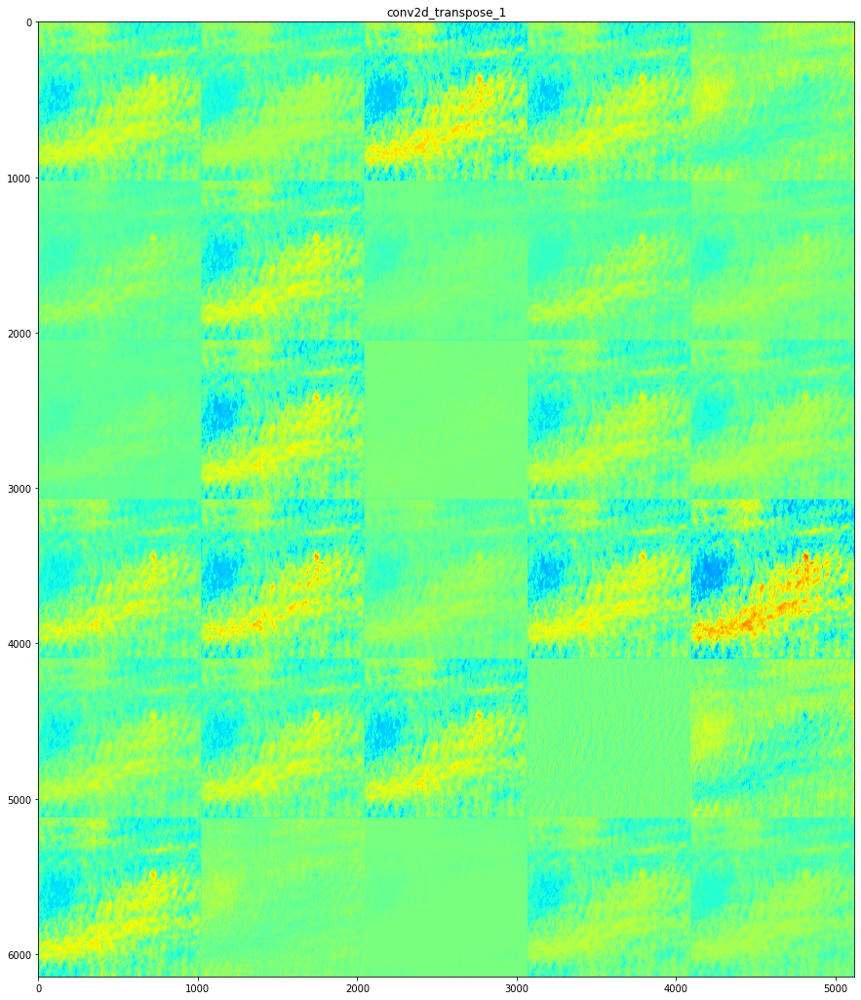

1


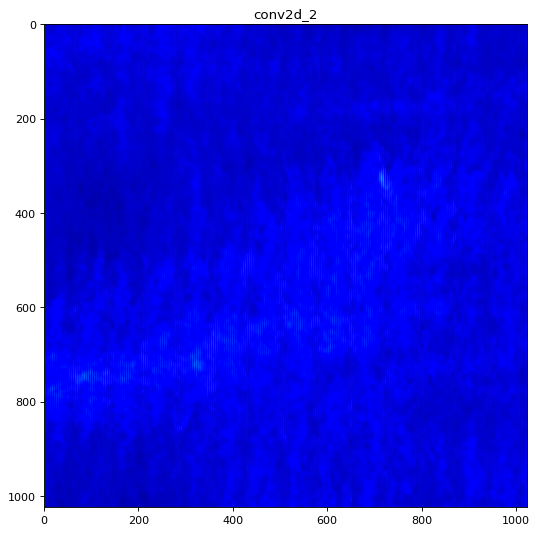

time: 18.2 s (started: 2022-01-09 15:48:10 +00:00)


In [75]:
# https://towardsdatascience.com/visualizing-intermediate-activation-in-convolutional-neural-networks-with-keras-260b36d60d0 

from matplotlib.pyplot import figure



layer_names = []
for layer in autoencoder.layers[:12]:
    layer_names.append(layer.name) # Names of the layers, so you can have them as part of your plot

activations = get_activations(autoencoder, next(validation_generator)[0][-2:-1], nested=True)
all_acts = list(activations.items())
activations = all_acts#[-2:]
    
images_per_row = 5

for layer_name, layer_activation in activations: # Displays the feature maps
    figure(figsize=(12, 8), dpi=80)
    n_features = layer_activation.shape[-1] # Number of features in the feature map
    size = layer_activation.shape[1] #The feature map has shape (1, size, size, n_features).
    print(n_features)

    if n_features > 1:
      n_cols = n_features // images_per_row # Tiles the activation channels in this matrix
      display_grid = np.zeros((size * n_cols, images_per_row * size))
      
      
      for col in range(n_cols): # Tiles each filter into a big horizontal grid
          for row in range(images_per_row):
              channel_image = layer_activation[0,
                                              :, :,
                                              col * images_per_row + row]
              channel_image -= channel_image.mean() # Post-processes the feature to make it visually palatable
              channel_image /= channel_image.std()
              channel_image *= 64
              channel_image += 128
              channel_image = np.clip(channel_image, 0, 255).astype('uint8')
              display_grid[col * size : (col + 1) * size, # Displays the grid
                          row * size : (row + 1) * size] = channel_image
      scale = 3. / size 
      plt.figure(figsize=(scale * display_grid.shape[1],
                          scale * display_grid.shape[0]))
      plt.title(layer_name)
      plt.grid(False)
      plt.imshow(display_grid, aspect='auto', cmap='jet')
      plt.show()

    else:

      plt.imshow(np.expand_dims(last_act[:,:,0,0], axis=0).reshape(target_size), cmap='jet')
      plt.title(layer_name)
      plt.show()

valid-2-3/cropped_image_all.png
conv2d_2


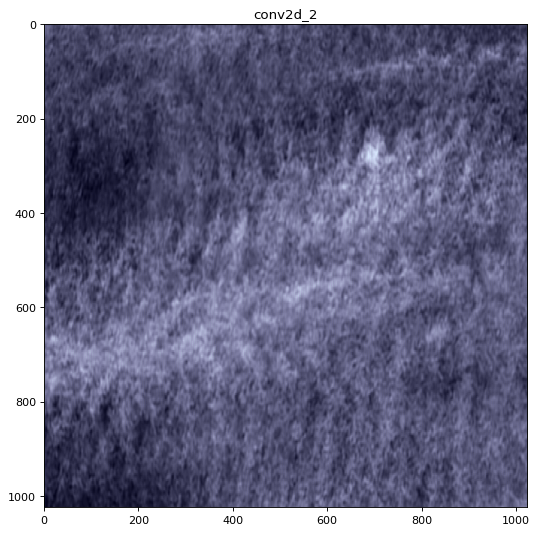

time: 1.36 s (started: 2022-01-09 15:53:41 +00:00)


In [83]:
import scipy as sp


def plot_activation(img):

    activations = get_activations(autoencoder, img, nested=True)
    all_acts = list(activations.items())
    last_act_tuple = all_acts[-1]
    last_layer, last_act = last_act_tuple
    print(last_layer)


    # pred = autoencoder.predict(input_sample)
    # pred_class = np.argmax(pred)
    # weights = autoencoder.layers[-1].get_weights()[0]
    # class_weights = weights[:, pred_class]
    # intermediate = Model(autoencoder.input,
    #                      autoencoder.get_layer("conv2d_2").output)
    # conv_output = intermediate.predict(img[np.newaxis,:,:,:])
    # conv_output = np.squeeze(conv_output)
    # h = int(img.shape[0]/conv_output.shape[0])
    # w = int(img.shape[1]/conv_output.shape[1])

    # act_maps = sp.ndimage.zoom(conv_output, (h, w, 1), order=1)
    # out = np.dot(act_maps.reshape((img.shape[0]*img.shape[1],512)), 
    #              class_weights).reshape(img.shape[0],img.shape[1])
    figure(figsize=(12, 8), dpi=80)
    plt.imshow(np.expand_dims(img, axis=0).reshape(target_size))
    # plt.imshow(out, cmap='jet', alpha=0.35)
    plt.imshow(np.expand_dims(last_act[:,:,0,0], axis=0).reshape(target_size), cmap='jet', alpha=0.15)
    plt.title(layer_name)
    plt.show()

nr_img = 10
input_sample = next(validation_generator)[0][nr_img]
print(validation_generator.filenames[nr_img])
plot_activation(input_sample)

Found 13 images belonging to 13 classes.


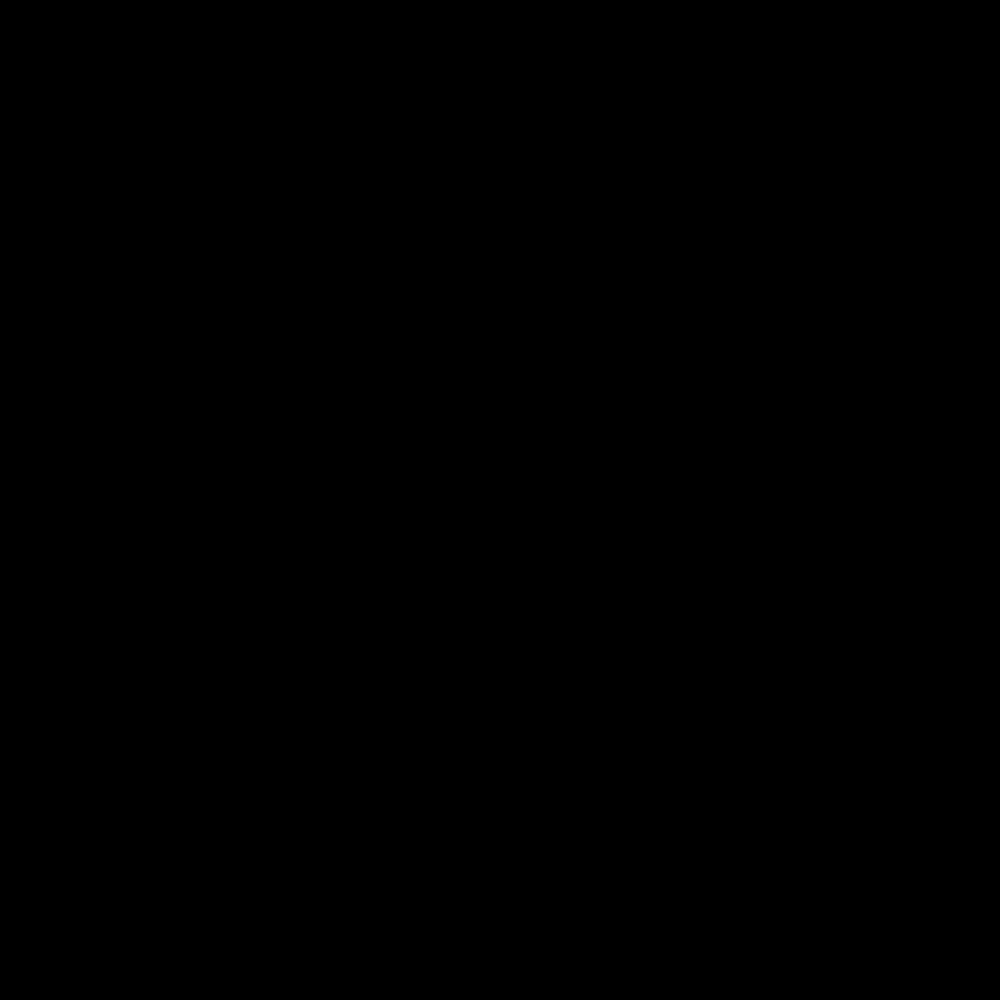

time: 459 ms (started: 2022-01-09 15:35:55 +00:00)


In [60]:
s = data_gen.flow_from_directory(
    test_dir, 
    target_size = target_size, 
    # color_mode='grayscale', 
    class_mode='input', 
    batch_size=batch_size)

im = next(s)[0][1]
im.shape
cv2_imshow(np.array(im, dtype = np.uint8 ))
# plt.imshow(im)

In [61]:
raise ValueError
# to end autorun all

ValueError: ignored

time: 18.3 ms (started: 2022-01-09 15:35:55 +00:00)


In [ ]:
import math 

for layer_name, acts in activations.items():
        print(layer_name, acts.shape, end=' ')

        c=1
        nrows = int(math.sqrt(acts.shape[c]) - 0.001) + 1  # best square fit for the given number
        ncols = int(math.ceil(acts.shape[c] / nrows))
        hmap = None
        fig_size=(24, 24)
        data_format = 'channels_last'
        cmap="gray"
        


        fig, axes = plt.subplots(nrows, ncols, squeeze=False, figsize=fig_size)
        for i in range(nrows * ncols):
            if i < acts.shape[c]:
                if len(acts.shape) == 3:
                    if data_format == 'channels_last':
                        img = acts[0, :, i]
                    elif data_format == 'channels_first':
                        img = acts[0, i, :]
                    else:
                        raise Exception('Unknown data_format.')
                    hmap = axes.flat[i].imshow([img], cmap=cmap)
                elif len(acts.shape) == 4:
                    if data_format == 'channels_last':
                        img = acts[0, :, :, i]
                    elif data_format == 'channels_first':
                        img = acts[0, i, :, :]
                    else:
                        raise Exception('Unknown data_format.')
                    hmap = axes.flat[i].imshow(img, cmap=cmap)
            axes.flat[i].axis('off')
        fig.suptitle(layer_name)
        fig.subplots_adjust(right=0.8)
        cbar = fig.add_axes([0.85, 0.15, 0.03, 0.7])
        if hmap is not None:
            fig.colorbar(hmap, cax=cbar)
            plt.show()
        # pyplot figures require manual closing
        index += 1
        plt.close(fig)

In [ ]:
import scipy as sp


def plot_activation(img):
    pred = autoencoder.predict(img[np.newaxis,:,:,:])
    pred_class = np.argmax(pred)
    print(pred_class)
    weights = autoencoder.layers[-1].get_weights()[0]
    class_weights = weights[:, pred_class]
    intermediate = Model(autoencoder.input,
                         autoencoder.get_layer("block5_conv3").output)
    conv_output = intermediate.predict(img[np.newaxis,:,:,:])
    conv_output = np.squeeze(conv_output)

    h = int(img.shape[0]/conv_output.shape[0])
    w = int(img.shape[1]/conv_output.shape[1])
    act_maps = sp.ndimage.zoom(conv_output, (h, w, 1), order=1)
    out = np.dot(act_maps.reshape((img.shape[0]*img.shape[1],512)), 
                 class_weights).reshape(img.shape[0],img.shape[1])
    plt.imshow(img.astype('float32').reshape(img.shape[0],
               img.shape[1],3))
    plt.imshow(out, cmap='jet', alpha=0.35)
    plt.title('Crack' if pred_class == 1 else 'No Crack')

In [ ]:
new = np.expand_dims(input_sample, axis=0).reshape(target_size)
plot_activation(input_sample)


In [ ]:
# from sklearn.metrics import classification_report, accuracy_score, confusion_matrix

# print(classification_report(label_test, np.argmax(model.predict(test_generator),axis=1)))


In [ ]:
# from PIL import Image
# #img_data = np.random.random(size=(100, 100, 3))
# img = tf.keras.preprocessing.image.array_to_img(train_data)
# array = tf.keras.preprocessing.image.img_to_array(img)

# def preprocess(array):
#     """
#     Normalizes the supplied array and reshapes it into the appropriate format.
#     """

#     array = array.astype("float32") / 255.0
#     array = np.reshape(array, (len(array), 28, 28, 1))
#     return array

# new = preprocess(train_data)

In [ ]:
# batchX, batchy = train_it.next()
# print('Batch shape=%s, min=%.3f, max=%.3f' % (batchX.shape, batchX.min(), batchX.max()))

# x_train = train_data.astype('float32') / 255.
# x_test = test_data.astype('float32') / 255.
# x_train = np.reshape(train_data, (len(train_data), 28, 28, 1))
# x_test = np.reshape(test_data, (len(test_data), 28, 28, 1))

In [ ]:
# not used anymore

# import itertools

# def iter_nth(iterable, nth):
#     return next(itertools.islice(iterable, nth, nth+1))

# new = iter_nth(test_generator, 2)
# len(new)

# name_2 = test_generator.filenames[2]
# a, b = iter_nth(test_generator, 2)
# new = SSIMLoss(a,a) 
# new.numpy()

----- trying 
 input_1
(1024, 1024, 1)
3


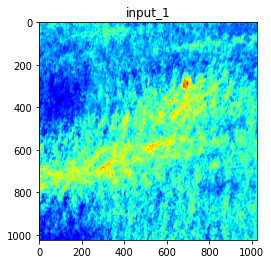

input_1 worked
----- trying 
 conv2d
(1024, 1024, 1, 32)
4
reframed:  (1024, 1024)


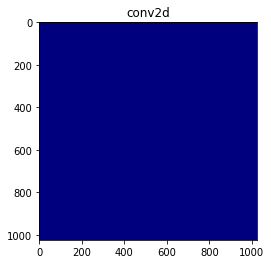

conv2d worked
----- trying 
 max_pooling2d
(1024, 512, 1, 32)
4
reframed:  (1024, 512)
max_pooling2d  didnt work
----- trying 
 conv2d_1
(1024, 512, 1, 32)
4
reframed:  (1024, 512)
conv2d_1  didnt work
----- trying 
 max_pooling2d_1
(1024, 256, 1, 32)
4
reframed:  (1024, 256)
max_pooling2d_1  didnt work
----- trying 
 conv2d_transpose
(1024, 512, 2, 32)
4
reframed:  (1024, 512)
conv2d_transpose  didnt work
----- trying 
 conv2d_transpose_1
(1024, 1024, 4, 32)
4
reframed:  (1024, 1024)


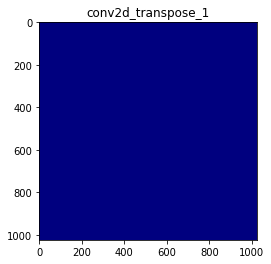

conv2d_transpose_1 worked
----- trying 
 conv2d_2
(1024, 1024, 4, 1)
4
reframed:  (1024, 1024)


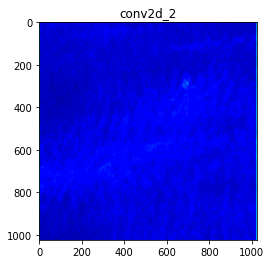

conv2d_2 worked
time: 903 ms (started: 2022-01-09 15:35:27 +00:00)


In [56]:
## archive some layers visualized working

for layer_name, acts in activations.items():
    # acts = list(activations.items())[0]
    # act = acts[1]
    print('----- trying \n', layer_name)
    print(acts.shape)
    print(len(acts.shape))
    
    
    try:
      if len(acts.shape) == 3:
        plt.imshow(np.expand_dims(acts, axis=0).reshape(target_size), cmap='jet')
        plt.title(layer_name)
        plt.show()
      else:
        print('reframed: ', acts[:,:,0,0].shape)
        plt.imshow(np.expand_dims(acts[:,:,0,0], axis=0).reshape(target_size), cmap='jet')
        plt.title(layer_name)
        plt.show()
      print(layer_name, 'worked')
    except: 
      print(layer_name,' didnt work')
    # new = act[0, :, 0]